# (1) Read Data, Determine Which Features to Keep


In [34]:
# Import liberaries if needed

#!pip install pycaret[full]
#! pip install pyod
#! pip install --upgrade scipy
#!pip install --upgrade lightgbm

# Import modules
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, PowerTransformer, MaxAbsScaler, Normalizer, QuantileTransformer
from scipy.stats import boxcox
from sklearn.decomposition import PCA, KernelPCA
import time
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA, KernelPCA
import random
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.cluster import DBSCAN
from pyod.models.knn import KNN
from pyod.models.mcd import MCD
from pyod.models.hbos import HBOS
from pyod.models.abod import ABOD
from sklearn.covariance import EllipticEnvelope
from scipy.stats import iqr
from sklearn.feature_selection import f_regression, mutual_info_regression

In [265]:
#Get the data and make a full report
from pycaret.datasets import get_data
data= get_data('well',profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature Importance based on f_regression, mutual_info_regression

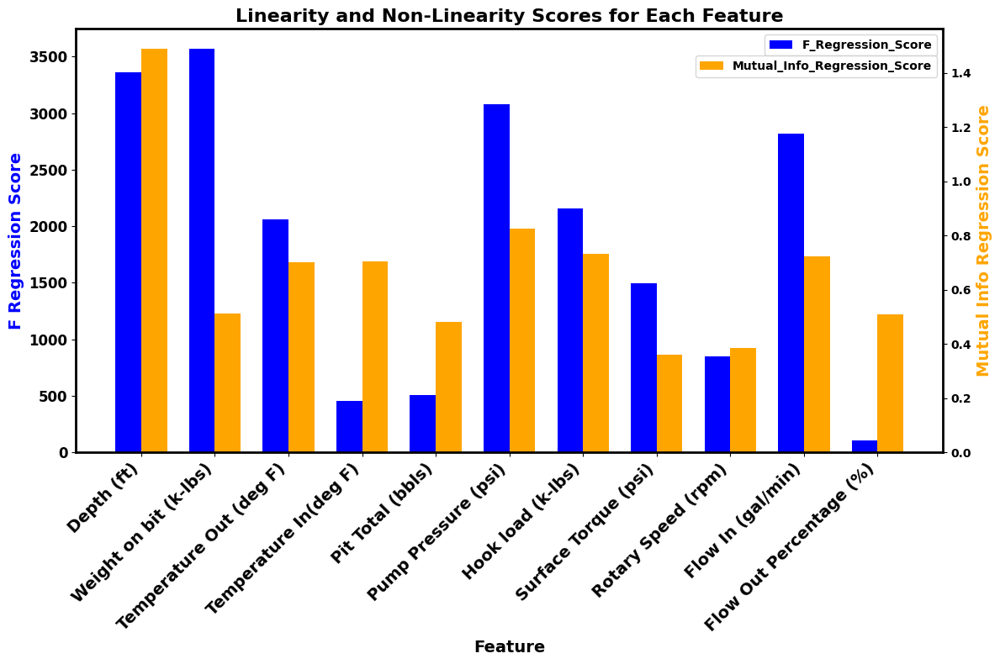

In [35]:
# Load your own dataset from a CSV file
data = pd.read_csv("well.csv")
# Assume X and y are your input features and target variable
X = data.iloc[:, :-1]  # data_no_outliers
y = data.iloc[:, -1:]  # data_no_outliers

# Evaluate linearity using f_regression
f_regression_scores, _ = f_regression(X, y)

# Evaluate non-linearity using mutual_info_regression
mutual_info_regression_scores = mutual_info_regression(X, y)

# Create a DataFrame to store the scores
scores_df = pd.DataFrame({
    'Feature': X.columns,
    'F_Regression_Score': f_regression_scores,
    'Mutual_Info_Regression_Score': mutual_info_regression_scores
})

# Plot two bars for each feature with different colors
fig, ax1 = plt.subplots(figsize=(12, 8))
bar_width = 0.35
index = np.arange(len(scores_df))

color1 = 'blue'
color2 = 'orange'

# Plot bars for F_Regression_Score on the first y-axis (ax1)
rects1 = ax1.bar(index, scores_df['F_Regression_Score'], bar_width, label='F_Regression_Score', color=color1)

# Create a second y-axis (ax2) sharing the same x-axis
ax2 = ax1.twinx()

# Plot bars for Mutual_Info_Regression_Score on the second y-axis (ax2)
rects2 = ax2.bar(index + bar_width, scores_df['Mutual_Info_Regression_Score'], bar_width, label='Mutual_Info_Regression_Score', color=color2)

# Labeling and formatting
ax1.set_xlabel('Feature', weight='bold', fontsize=14)
ax1.set_ylabel('F Regression Score', color=color1, weight='bold', fontsize=14)
ax2.set_ylabel('Mutual Info Regression Score', color=color2, weight='bold', fontsize=14)
ax1.set_title('Linearity and Non-Linearity Scores for Each Feature', weight='bold', fontsize=16)
ax1.set_xticks(index + bar_width / 2)
ax1.set_xticklabels(scores_df['Feature'], rotation=45, ha='right', weight='bold', fontsize=14)

# Make y-axis tick labels bold
for label in ax1.get_yticklabels():
    label.set_fontweight('bold')
    label.set_fontsize(12)

for label in ax2.get_yticklabels():
    label.set_fontweight('bold')
    label.set_fontsize(12)

# Position the legends below each other
legend1 = ax1.legend(loc='upper right', bbox_to_anchor=(1, 1))
legend2 = ax2.legend(loc='upper right', bbox_to_anchor=(1, 0.95))
# Make legend font bold
legend1.get_texts()[0].set_weight('bold')
legend2.get_texts()[0].set_weight('bold')

# Remove grid
ax1.grid(False)
ax2.grid(False)

plt.xticks(fontsize=10, weight='bold')
plt.yticks(fontsize=10, weight='bold')
plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame

# Show plot
plt.tight_layout()
plt.show()


## Feature Importance based on Trees

In [272]:
data = data.sample(frac=0.9)    # frac is the percent of spliting
data_unseen = data.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

# Set model

from pycaret.regression import *
exp_reg101 = setup(data = data,
                   target = 'ROP (ft/hr)',
                   train_size = 0.9,
                   session_id=123,
                   use_gpu= True,
                   fold =5,
                   fold_shuffle =True,
                   data_split_shuffle= True,
                   ignore_features= None,                #Optional[List[str]] = None,
                   keep_features= None,                  #Optional[List[str]] = None,

                   remove_multicollinearity= True,
                   multicollinearity_threshold = 0.8,
                   remove_outliers=True,
                   outliers_method = 'iforest',
                   outliers_threshold = 0.1,
                   imputation_type = None,
                   numeric_imputation= 'median',
                   transformation = True,
                   transformation_method = 'quantile',
                   normalize = True,
                   normalize_method = 'zscore',
                   transform_target= False,
                   pca = False,
                   pca_method='kernel',
                   pca_components = 5,   
                   
                   
                   polynomial_features =False,
                   polynomial_degree = 2,            # integer
                   low_variance_threshold = None,   # float

                   feature_selection = True,
                   # When set to True, a subset of features is selected based on a feature importance score determined by feature_selection_estimator.
                   #feature_selection_method: str = 'classic',
                   feature_selection_estimator = 'et', #'lightgbm',   #,
                   n_features_to_select = 0.9,
                   
                   
                   profile_kwargs=True,
                   )
# create model
# Testing the feature importance based on the Decision Tree algorithm
et = create_model('et',
                   fold = 5,
                   return_train_score = False,
                   cross_validation = True,
                  )
# Evaluate Model
evaluate_model(et)




[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of

,Description,Value
0,Session id,123
1,Target,ROP (ft/hr)
2,Target type,Regression
3,Original data shape,"(4792, 12)"
4,Transformed data shape,"(4360, 10)"
5,Transformed train set shape,"(3880, 10)"
6,Transformed test set shape,"(480, 10)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,None


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,17.6601,5969.3423,77.2615,0.2585,0.4610,0.4530
1,13.4583,3576.2695,59.8019,0.3329,0.4174,0.4186
2,13.6026,2844.3758,53.3327,0.3417,0.4347,0.4589
3,11.5348,2217.3623,47.0889,0.4157,0.3768,0.4042
4,10.1156,1331.2805,36.4867,0.5282,0.3985,0.4406
Mean,13.2743,3187.7261,54.7943,0.3754,0.4177,0.4351
Std,2.5448,1574.4358,13.6127,0.0912,0.0290,0.0207


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Start ML Modeling

In [36]:
# Load your own dataset from a CSV file
data = pd.read_csv("well.csv")
# Assuming your DataFrame is called 'data'

target_column_name = data.columns[-1]  # Assuming the target column is the last column
# Filter rows where the target column is not equal to 0
data = data[data[target_column_name] != 0].copy()

# Save the filtered data to an Excel sheet named 'well'
data.to_csv('well.csv', index=False)

# Display column names with numbers
print("Column Numbers:")
for i, col in enumerate(data.columns, start=1):
    print(f"{i}. {col}")
# Ask the user for columns to drop using numbers
columns_to_drop_input = input("Enter column numbers to drop (comma-separated) or '0' to drop none: ")
if columns_to_drop_input == '0':
    # If the user entered '0', drop none of the columns
    print("No columns dropped.")
else:
    columns_to_drop_numbers = columns_to_drop_input.split(',')
    
    # Convert column numbers to column names
    columns_to_drop = [data.columns[int(num) - 1] for num in columns_to_drop_numbers]

    # Drop selected columns
    data = data.drop(columns=columns_to_drop, errors='ignore')
    print(f"Columns {', '.join(columns_to_drop)} dropped.")

# Show the data frame after choosing which data to keep
data

Column Numbers:
1. Depth (ft)
2. Weight on bit (k-lbs)
3. Temperature Out (deg F)
4. Temperature In(deg F)
5. Pit Total (bbls)
6. Pump Pressure (psi)
7. Hook load (k-lbs)
8. Surface Torque (psi)
9. Rotary Speed (rpm)
10. Flow In (gal/min)
11. Flow Out Percentage (%)
12. ROP (ft/hr)
Enter column numbers to drop (comma-separated) or '0' to drop none: 0
No columns dropped.


,Depth (ft),Weight on bit (k-lbs),Temperature Out (deg F),Temperature In(deg F),Pit Total (bbls),Pump Pressure (psi),Hook load (k-lbs),Surface Torque (psi),Rotary Speed (rpm),Flow In (gal/min),Flow Out Percentage (%),ROP (ft/hr)
0,85.18,0.00,93.49,90.87,274.83,463.72,31.77,8.93,151.09,1109.58,101.61,56.80
1,86.18,0.00,93.52,90.83,274.83,459.53,31.01,8.93,151.09,1108.36,101.70,61.14
2,87.23,0.00,94.25,90.91,273.80,454.57,31.01,9.01,61.54,1102.87,96.81,18.58
3,88.26,0.00,94.44,91.14,273.79,451.14,31.16,8.97,60.23,1101.04,96.67,38.29
4,89.36,0.00,94.48,91.18,273.80,456.09,31.54,8.97,61.75,1102.46,96.63,394.38
...,...,...,...,...,...,...,...,...,...,...,...,...
7300,7532.21,30.55,138.89,121.22,240.25,1549.23,128.63,152.25,34.91,609.49,75.66,10.81
7301,7533.22,30.23,138.89,121.14,240.26,1565.90,128.95,150.91,34.78,615.09,76.51,13.51
7302,7534.23,29.95,139.08,121.22,240.38,1506.81,129.23,153.73,34.72,635.76,80.00,12.62
7303,7535.24,31.06,139.31,121.33,241.27,1408.32,128.12,145.00,36.49,627.15,77.92,14.72


In [ ]:
# Create a pair plot with coloring based on the specified variable
sns.set(style="ticks")
sns.pairplot(data)  # You can specify a different color palette if needed
# Show the plot
plt.show()

# Optional (to remove all raws with zeros

In [210]:
# Step 1: Drop rows with NaN or zero values
data = data.replace({0: np.nan}).dropna()
data

,Depth (ft),Weight on bit (k-lbs),Temperature Out (deg F),Temperature In(deg F),Pit Total (bbls),Pump Pressure (psi),Hook load (k-lbs),Surface Torque (psi),Rotary Speed (rpm),Flow In (gal/min),Flow Out Percentage (%),ROP (ft/hr)
6,91.39,0.76,94.52,91.21,273.80,454.19,29.33,8.97,62.07,1102.06,96.72,450.72
12,97.75,2.13,94.55,91.37,273.79,452.28,27.96,8.97,56.05,1103.28,96.07,348.28
26,114.50,2.82,85.86,93.08,275.81,386.33,27.27,8.82,97.45,1066.39,79.22,368.77
29,117.63,0.61,84.76,93.12,275.81,390.90,29.48,8.82,89.82,1073.92,79.64,348.28
243,346.75,8.42,103.48,104.63,253.99,464.48,51.98,6.91,207.23,1045.80,60.35,361.31
...,...,...,...,...,...,...,...,...,...,...,...,...
7300,7532.21,30.55,138.89,121.22,240.25,1549.23,128.63,152.25,34.91,609.49,75.66,10.81
7301,7533.22,30.23,138.89,121.14,240.26,1565.90,128.95,150.91,34.78,615.09,76.51,13.51
7302,7534.23,29.95,139.08,121.22,240.38,1506.81,129.23,153.73,34.72,635.76,80.00,12.62
7303,7535.24,31.06,139.31,121.33,241.27,1408.32,128.12,145.00,36.49,627.15,77.92,14.72


# (2) Determine How to Remove the Noise

Choose an outlier removal method:
1. Isolation Forest
2. Local Outlier Factor
3. One-Class SVM
4. DBSCAN (Cluster-Based)
5. K-Nearest Neighbors (KNN)
6. Minimum Covariance Determinant (MCD)
7. Elliptic Envelope
8. Angle-based Outlier Detector (ABOD)
9. Histogram-based Outlier Detection (HBOS)
10. AutoEncoder (AE)
11. IQR Method
Enter the number of your choice: 1

Choose the contamination level (percentage of outliers to be removed):
1. 5.0%
2. 10.0%
3. 15.0%
4. 20.0%
5. 25.0%
Enter the number of your choice: 2


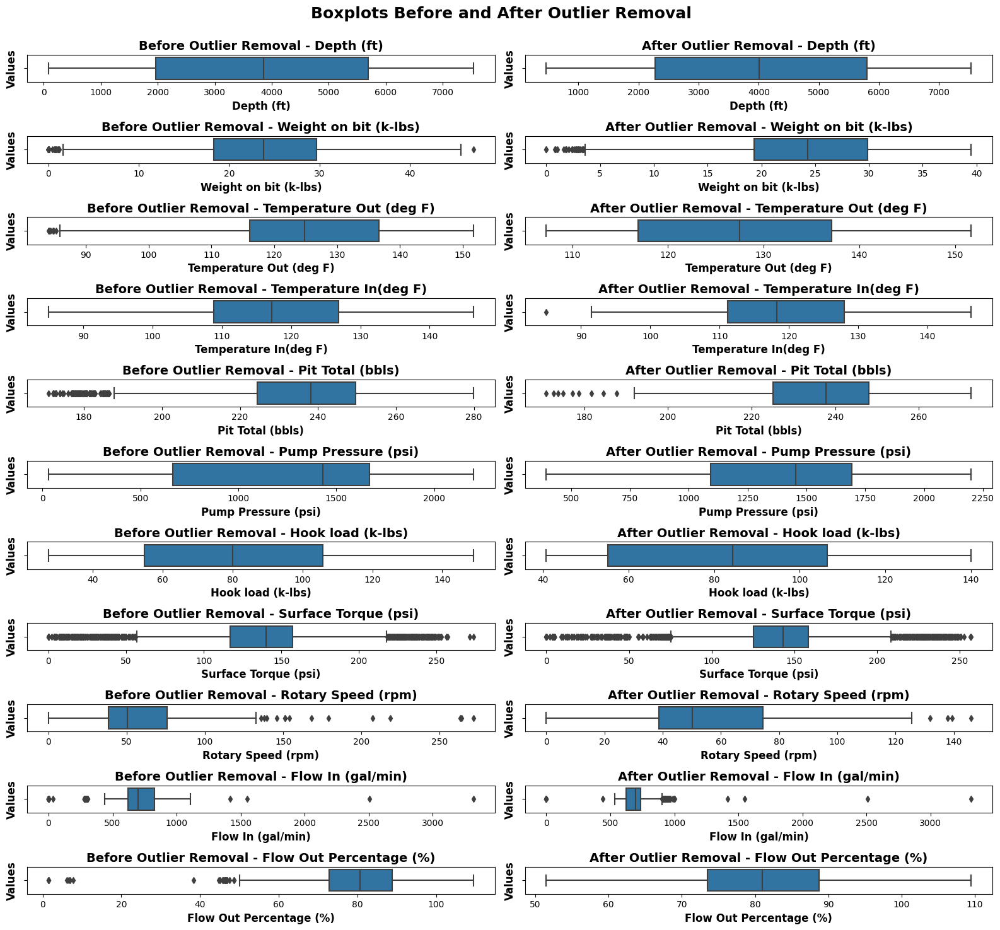

In [37]:
# Step 1: User chooses the outlier removal method
print("Choose an outlier removal method:")
print("1. Isolation Forest")
print("2. Local Outlier Factor")
print("3. One-Class SVM")
print("4. DBSCAN (Cluster-Based)")
print("5. K-Nearest Neighbors (KNN)")
print("6. Minimum Covariance Determinant (MCD)")
print("7. Elliptic Envelope")
print("8. Angle-based Outlier Detector (ABOD)")
print("9. Histogram-based Outlier Detection (HBOS)")
print("10. AutoEncoder (AE)")
print("11. IQR Method")

method_choice = int(input("Enter the number of your choice: "))

# Split the data into features (X) and target (y)
features = data.iloc[:, :-1]  # All columns except the last one
target = data.iloc[:, -1]   # The last column

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Step 2: User chooses the contamination level
contamination_values = [0.05, 0.10, 0.15, 0.20, 0.25]
print("\nChoose the contamination level (percentage of outliers to be removed):")
for i, contamination in enumerate(contamination_values, start=1):
    print(f"{i}. {contamination * 100}%")
contamination_choice = int(input("Enter the number of your choice: ")) - 1
contamination = contamination_values[contamination_choice]

# Step 3: Initialize outlier detection models or use IQR method
if method_choice == 1:
    model = IsolationForest(contamination=contamination, n_estimators=500, bootstrap=True, random_state=42)
elif method_choice == 2:
    model = LocalOutlierFactor(contamination=contamination, n_neighbors=20)
elif method_choice == 3:
    model = OneClassSVM(nu=contamination)
elif method_choice == 4:
    model = DBSCAN(eps=0.5, min_samples=5)
elif method_choice == 5:
    model = KNN(contamination=contamination, n_neighbors=3, algorithm='auto')
elif method_choice == 6:
    model = MCD(contamination=contamination, assume_centered=False, support_fraction=0.1, random_state=42)
elif method_choice == 7:
    model = EllipticEnvelope(contamination=contamination)
elif method_choice == 8:
    model = ABOD(contamination=contamination, n_neighbors=3, method='fast')
elif method_choice == 9:
    model = HBOS(contamination=contamination)
elif method_choice == 10:
    model = AutoEncoder(contamination=contamination)
elif method_choice == 11:
    # IQR method on the whole data
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR_values = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR_values
    upper_bound = Q3 + 1.5 * IQR_values
    outliers = ((data < lower_bound) | (data > upper_bound)).any(axis=1)

    # Filter inliers
    data_inliers = data[~outliers]

    # Split the data into features (X) and target (y) for inliers
    features_inliers = data_inliers.iloc[:, :-1]  # All columns except the last one
    target_inliers = data_inliers.iloc[:, -1]   # The last column

    # Split the inliers data into training and testing sets
    X_train_inliers, X_test_inliers, y_train, y_test = train_test_split(features_inliers, target_inliers, test_size=0.2, random_state=42)
else:
    raise ValueError("Invalid method choice")

if method_choice != 11:
    X_train_i = pd.DataFrame(model.fit_predict(X_train), index=X_train.index, columns=['outlier'])
    X_test_i = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=['outlier'])

    # Filter inliers
    X_train_inliers = X_train[X_train_i['outlier'] != -1]
    X_test_inliers = X_test[X_test_i['outlier'] != -1]
    # Predict target variable for inliers
    y_train = y_train.loc[X_train_inliers.index]
    y_test = y_test.loc[X_test_inliers.index]  

# Visualize boxplots for each feature before and after outlier removal
plt.figure(figsize=(16, 16))
plt.suptitle('Boxplots Before and After Outlier Removal', fontsize=18, weight='bold', y=1)

# Create a subplot for each feature
for i, feature in enumerate(features.columns, start=1):
    plt.subplot(12, 2, (i * 2) - 1)
    sns.boxplot(x=X_train[feature])
    plt.title(f'Before Outlier Removal - {feature}', fontsize=14, weight='bold')
    plt.xlabel(feature, fontsize=12, weight='bold')
    plt.ylabel('Values', fontsize=12, weight='bold')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.subplot(12, 2, i * 2)
    sns.boxplot(x=X_train_inliers[feature])
    plt.title(f'After Outlier Removal - {feature}', fontsize=14, weight='bold')
    plt.xlabel(feature, fontsize=12, weight='bold')
    plt.ylabel('Values', fontsize=12, weight='bold')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()


## Seeing Data Distribution

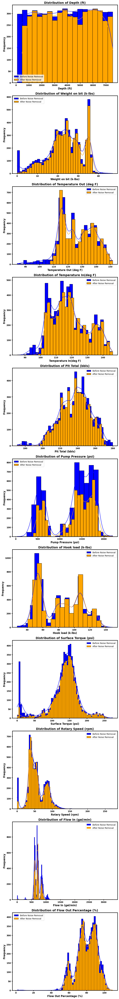

In [38]:
# Features and target columns
features = X_train_inliers.columns

# Create a subplot grid for all variables
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(8, 6 * len(features)))

# Create distribution plots for all variables before and after noise removal
for i, column in enumerate(features):
    sns.histplot(X_train[column], kde=True, color='blue', label='Before Noise Removal', ax=axes[i],alpha=1)
    sns.histplot(X_train_inliers[column], kde=True, color='orange', label='After Noise Removal', ax=axes[i],alpha=1)
    
    axes[i].set_title(f"Distribution of {column}", fontsize=14, weight='bold')
    axes[i].set_xlabel(column, fontsize=12, weight='bold')
    axes[i].set_ylabel("Frequency", fontsize=12, weight='bold')
    axes[i].tick_params(axis='both', which='both', labelsize=10, width=2)
    axes[i].spines['bottom'].set_linewidth(2)
    axes[i].spines['left'].set_linewidth(2)
    axes[i].spines['top'].set_linewidth(2)
    axes[i].spines['right'].set_linewidth(2)
    axes[i].xaxis.label.set_fontsize(12)
    axes[i].xaxis.label.set_weight('bold')
    axes[i].yaxis.label.set_fontsize(12)
    axes[i].yaxis.label.set_weight('bold')
    axes[i].grid(False)
    axes[i].legend(fontsize=10)
    
    # Make axis numbers bold
    for tick in axes[i].get_xticklabels() + axes[i].get_yticklabels():
        tick.set_fontweight('bold')

plt.tight_layout()
plt.show()


# (3) Determine How to Scale Data

In [39]:
# Let the user choose the scaling technique
print("Choose a scaling technique:")
print("1. Robust Scaling")
print("2. Standard Scaling")
print("3. Min-Max Scaling")
print("4. Box-Cox Transformation")
print("5. Log Transformation")
print("6. Power Transformation")
print("7. Max Absolute Scaling")
print("8. Unit Vector Scaling")
print("9. Quantile Transformation")
print("10. Log Ratio Transformation")

choice = input("Enter the number of the chosen scaling technique: ").strip()

# Initialize the selected scaler
if choice == "1":
    scaler = RobustScaler()
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "2":
    scaler = StandardScaler()
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "3":
    scaler = MinMaxScaler()
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "4":
    # Apply Box-Cox transformation to all features (Note: Box-Cox requires positive values)
    X_train_s = X_train_inliers.apply(lambda x: boxcox(x + 1)[0], axis=0)  # Adding 1 to handle zero values
    X_test_s = X_test_inliers.apply(lambda x: boxcox(x + 1)[0], axis=0)  # Adding 1 to handle zero values
elif choice == "5":
    # Apply Log transformation to all features (Note: Log requires positive values)
    X_train_s = X_train_inliers.apply(lambda x: np.log1p(x), axis=0)  # Using np.log1p to handle zero values
    X_test_s = X_test_inliers.apply(lambda x: np.log1p(x), axis=0)  # Using np.log1p to handle zero values
elif choice == "6":
    scaler = PowerTransformer(method="yeo-johnson")
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "7":
    scaler = MaxAbsScaler()
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "8":
    scaler = Normalizer()
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "9":
    scaler = QuantileTransformer(output_distribution="normal")
    X_train_s = pd.DataFrame(scaler.fit_transform(X_train_inliers), columns=X_train_inliers.columns)
    X_test_s = pd.DataFrame(scaler.transform(X_test_inliers), columns=X_train_inliers.columns)
elif choice == "10":
    # Apply Log Ratio Transformation to all features
    geometric_mean = X_train_inliers.mean().pow(0.5)
    X_train_s = X_train_inliers.divide(geometric_mean)
    X_test_s = X_test_inliers.divide(geometric_mean)

Choose a scaling technique:
1. Robust Scaling
2. Standard Scaling
3. Min-Max Scaling
4. Box-Cox Transformation
5. Log Transformation
6. Power Transformation
7. Max Absolute Scaling
8. Unit Vector Scaling
9. Quantile Transformation
10. Log Ratio Transformation
Enter the number of the chosen scaling technique: 1


## Seeing the data distribution

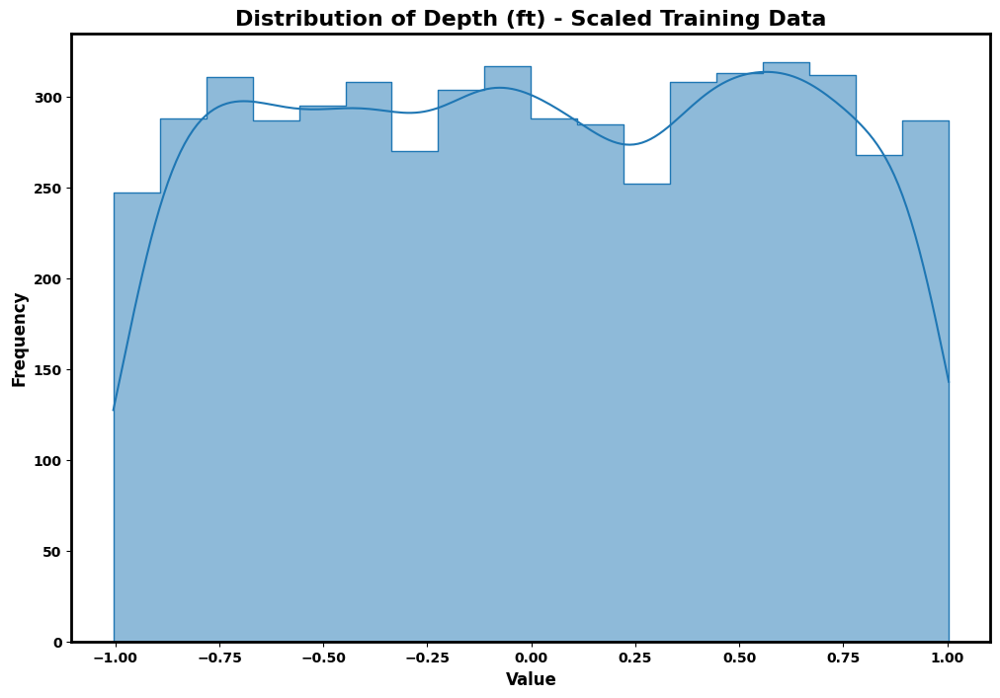

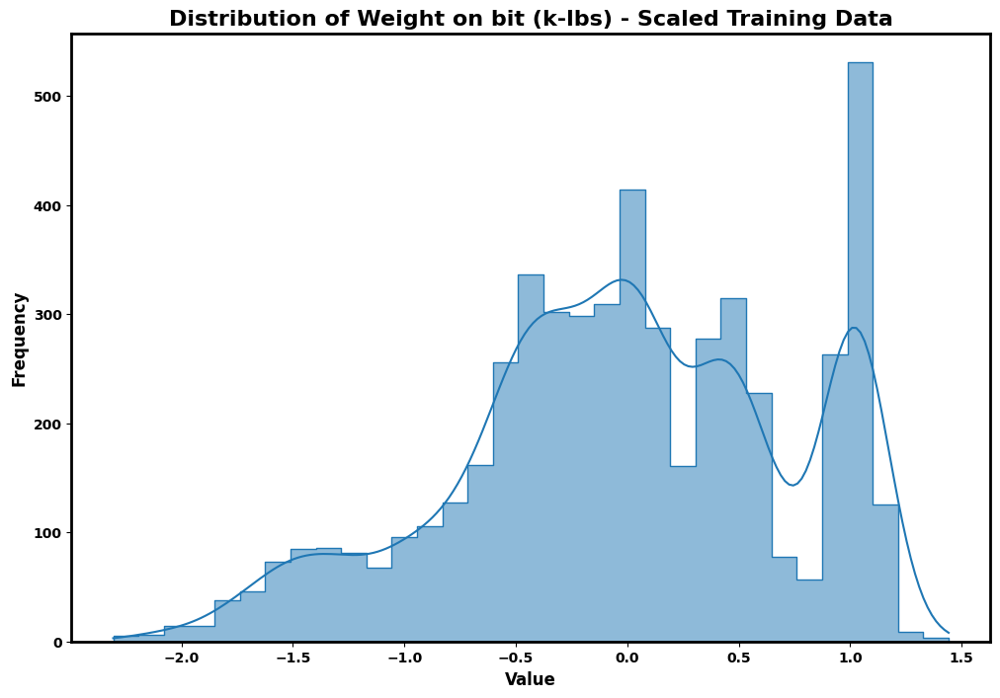

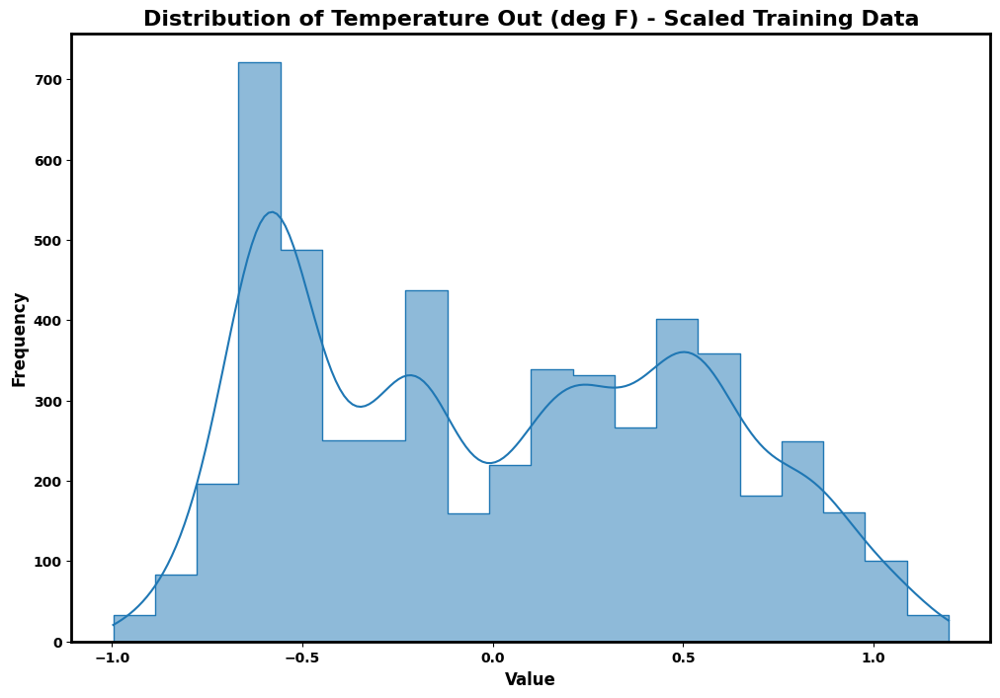

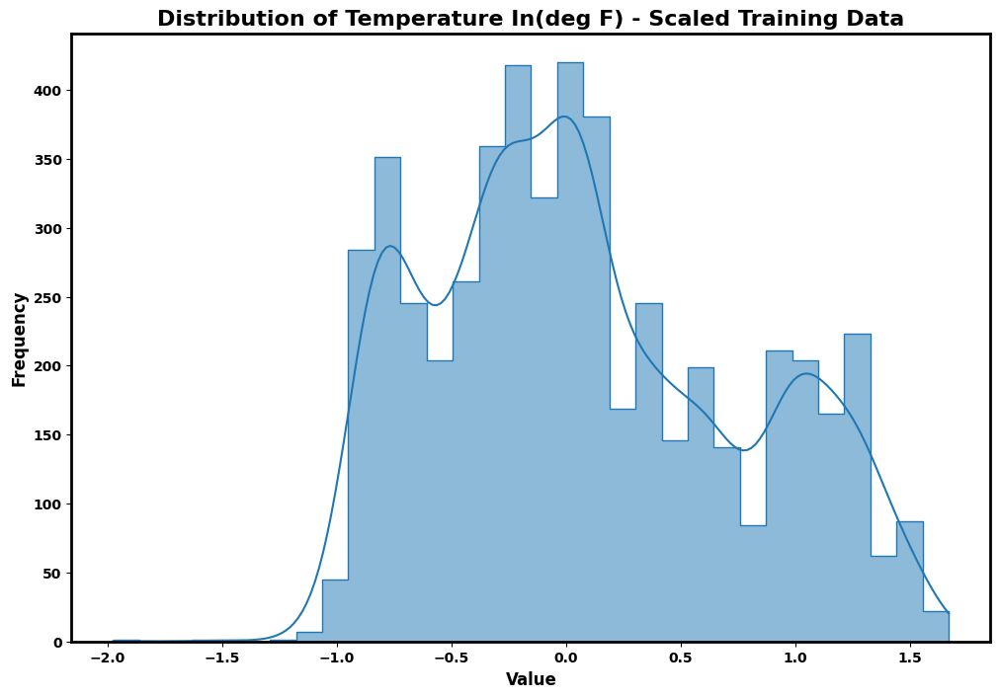

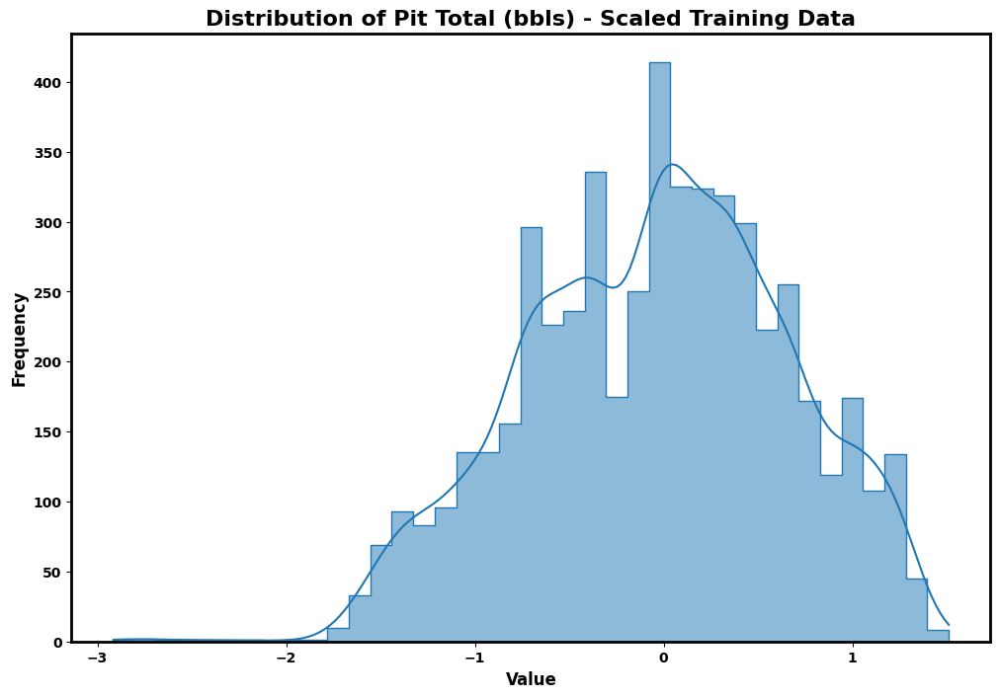

...

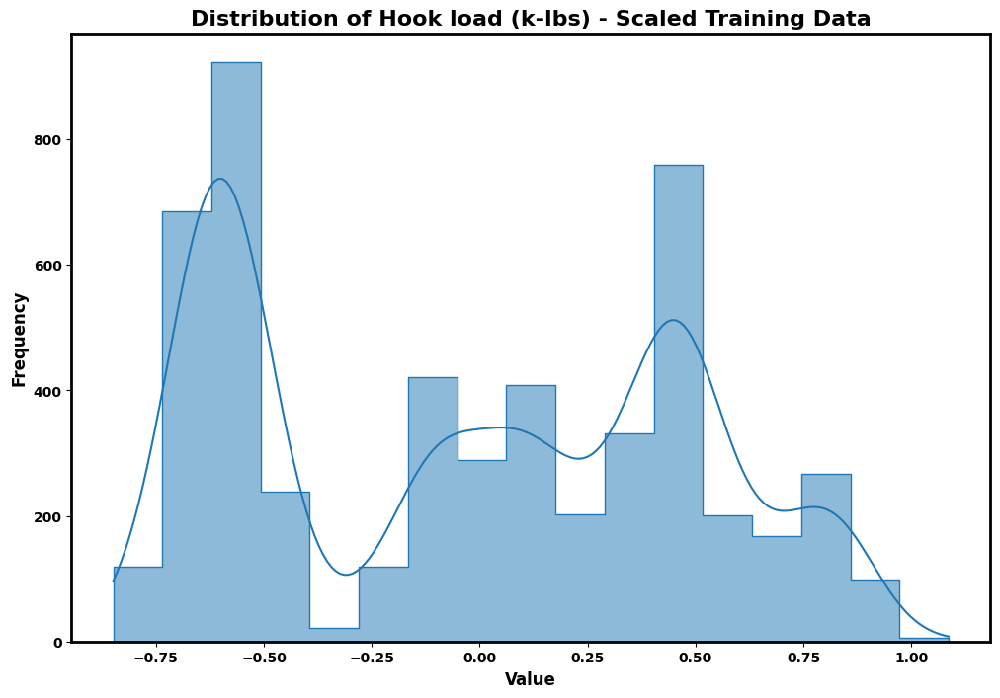

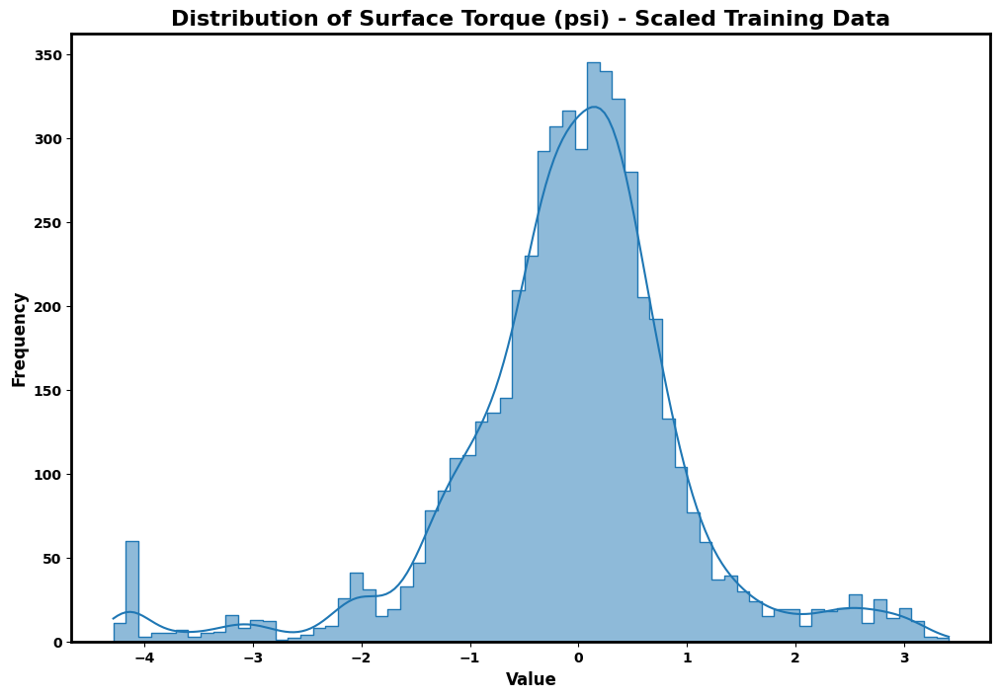

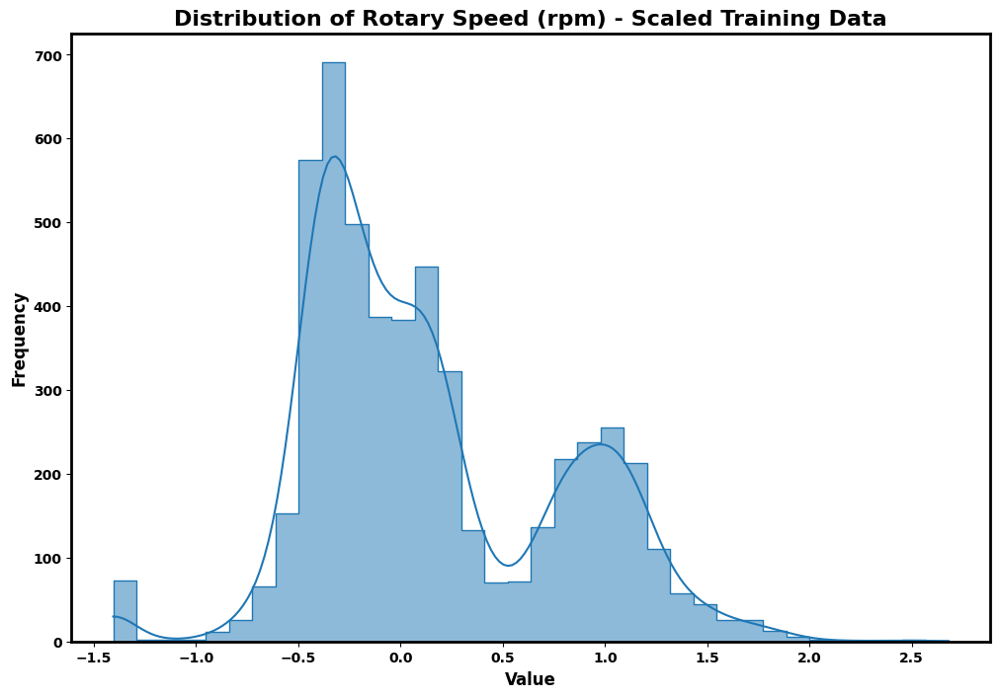

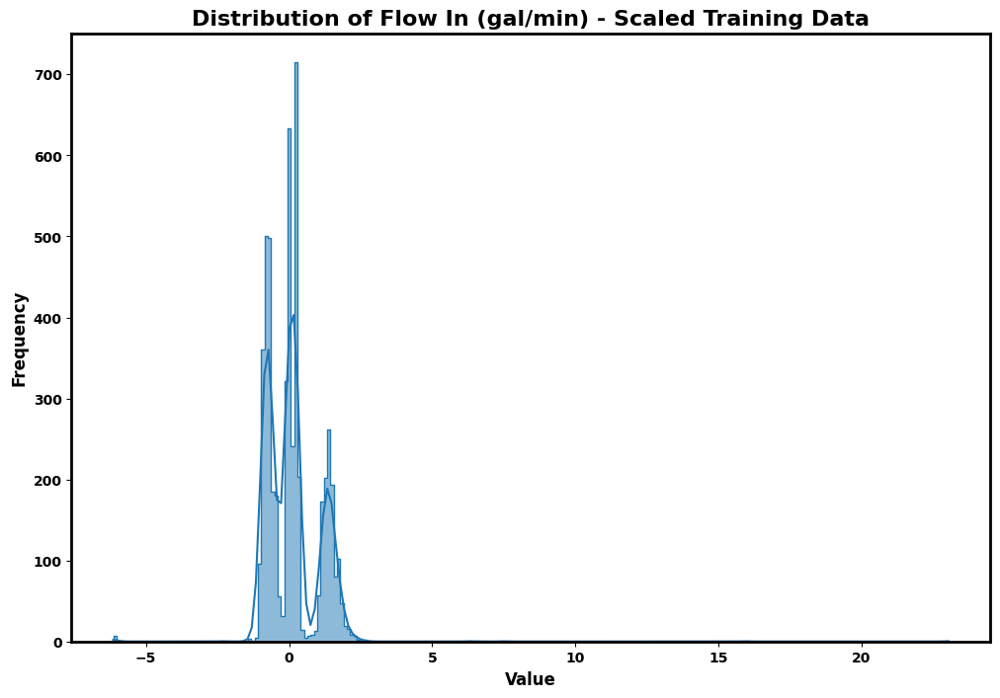

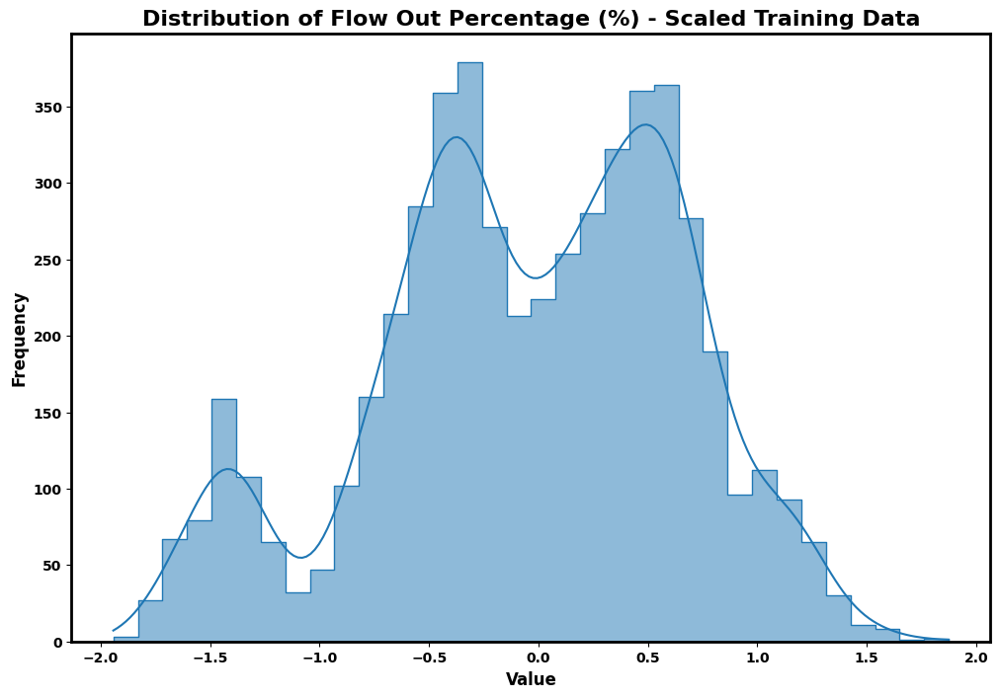

In [40]:
# Create distribution plots for the scaled training data
for column in X_train_s.columns:
    plt.figure(figsize=(12, 8))
    plt.title(f"Distribution of {column} - Scaled Training Data", fontsize=16, weight='bold')

    sns.histplot(data=X_train_s, x=column, kde=True, label=column, element="step", common_norm=False)

    plt.xlabel("Value", fontsize=12, weight='bold')
    plt.ylabel("Frequency", fontsize=12, weight='bold')
    plt.xticks(fontsize=10, weight='bold')
    plt.yticks(fontsize=10, weight='bold')
    plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
    plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
    plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
    plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame
    plt.grid(False)
    plt.show()
# Create distribution plots for the scaled test data
for column in X_test_s.columns:
    plt.figure(figsize=(12, 8))
    plt.title(f"Distribution of {column} - Scaled Training Data", fontsize=16, weight='bold')

    sns.histplot(data=X_train_s, x=column, kde=True, label=column, element="step", common_norm=False)

    plt.xlabel("Value", fontsize=12, weight='bold')
    plt.ylabel("Frequency", fontsize=12, weight='bold')
    plt.xticks(fontsize=10, weight='bold')
    plt.yticks(fontsize=10, weight='bold')
    plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
    plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
    plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
    plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame
    plt.grid(False)
    plt.show()

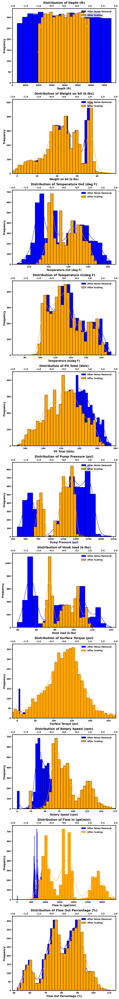

In [9]:
# Features and target columns
features = X_train_inliers.columns

# Create a subplot grid for all variables
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(8, 6 * len(features)))

# Create distribution plots for all variables before and after noise removal
for i, column in enumerate(features):
    ax1 = axes[i]
    ax2 = ax1.twiny()  # Create a twin Axes for the second x-axis
    
    sns.histplot(X_train_inliers[column], kde=True, color='blue', label='After Noise Removal', ax=ax1, alpha=1)
    sns.histplot(X_train_s[column], kde=True, color='orange', label='After Scaling', ax=ax2, alpha=1)  # Use ax2 for the second dataset
    
    ax1.set_title(f"Distribution of {column}", fontsize=14, weight='bold')
    ax1.set_xlabel(column, fontsize=12, weight='bold')
    ax1.set_ylabel("Frequency", fontsize=12, weight='bold', color='black')
    ax1.tick_params(axis='both', which='both', labelsize=10, width=2)
    ax1.spines['bottom'].set_linewidth(2)
    ax1.spines['left'].set_linewidth(2)
    ax1.spines['top'].set_linewidth(2)
    ax1.spines['right'].set_linewidth(2)
    ax1.xaxis.label.set_fontsize(12)
    ax1.xaxis.label.set_weight('bold')
    ax1.yaxis.label.set_fontsize(12)
    ax1.yaxis.label.set_weight('bold')
    ax1.grid(False)
    
    # Set limits for the twin x-axis
    ax2.set_xlim(-2, 2)
    ax2.set_xlabel('')  # Remove x-axis label
    ax2.xaxis.label.set_fontsize(10)  # Set font size to 0 to hide the label
    ax2.xaxis.label.set_weight('bold')
    ax2.tick_params(axis='both', which='both', labelsize=10)
    ax2.spines['bottom'].set_linewidth(2)
    ax2.spines['left'].set_linewidth(2)
    ax2.spines['top'].set_linewidth(2)
    ax2.spines['right'].set_linewidth(2)    
    ax2.grid(False)
    # Make axis numbers bold
    for tick in ax1.get_xticklabels() + ax1.get_yticklabels():
        tick.set_fontweight('bold')
    
    for tick in ax2.get_xticklabels() + ax2.get_yticklabels():
        tick.set_fontweight('bold')

    # Add separate legends for each subplot with bold text
    legend1 = ax1.legend(loc='upper left', fontsize=10, bbox_to_anchor=(0.65, 1))
    for text in legend1.get_texts():
        text.set_fontweight('bold')
        
    legend2 = ax2.legend(loc='upper left', fontsize=10, bbox_to_anchor=(0.65, 0.95))
    for text in legend2.get_texts():
        text.set_fontweight('bold')

# Adjust layout
plt.tight_layout()
plt.show()


# (4) Determine Applying PCA or Not

Enter the dimensionality reduction method ('pca' or 'kernel_pca'): pca
Enter the kernel type ('linear', 'poly', or 'rbf'): rbf
Enter the number of components (or press Enter for automatic determination): 6


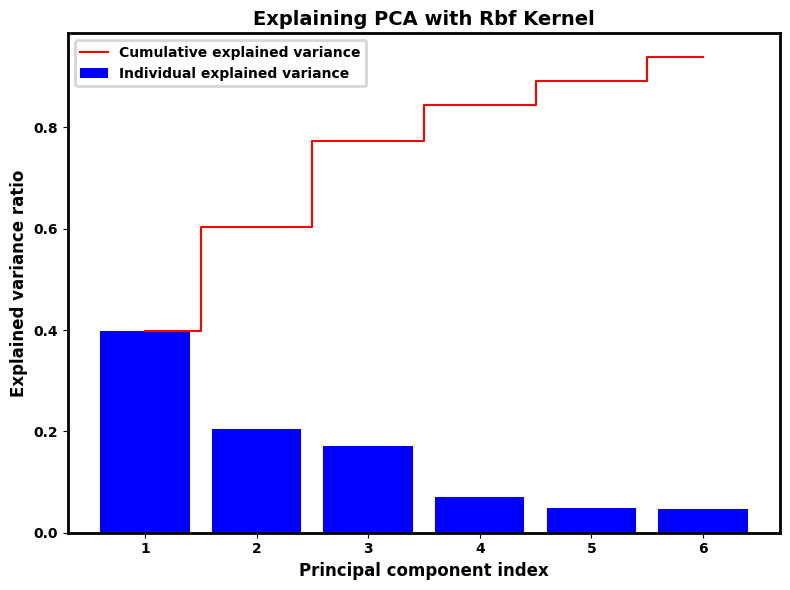

Do you want to apply PCA before running Lasso regression? (yes/no): no


In [41]:
def apply_dimensionality_reduction(X_train_s, X_test_s, method='pca', kernel='linear', n_components=None):
    """
    Apply dimensionality reduction using PCA or KernelPCA based on user input.

    Parameters:
        X_train_s (numpy.ndarray): Scaled training data.
        X_test_s (numpy.ndarray): Scaled testing data.
        method (str): Dimensionality reduction method ('pca' or 'kernel_pca').
        kernel (str): Kernel type for KernelPCA ('linear', 'poly', or 'rbf').
        n_components (int): Number of components for PCA or KernelPCA.

    Returns:
        tuple: Transformed training and testing data, explained variance ratio (for PCA),
               and cumulative sum of eigenvalues (for PCA).
    """
    if method == 'pca':
        # Perform PCA
        pca = PCA(n_components=n_components)
        X_train_scaled_pca = pca.fit_transform(X_train_s)
        X_test_scaled_pca = pca.transform(X_test_s)
        explained_variance_ratio = pca.explained_variance_ratio_
        cum_sum_eigenvalues = np.cumsum(explained_variance_ratio)
    elif method == 'kernel_pca':
        # Perform KernelPCA
        kpca = KernelPCA(kernel=kernel, n_components=n_components)
        X_train_scaled_pca = kpca.fit_transform(X_train_s)
        X_test_scaled_pca = kpca.transform(X_test_s)
        explained_variance_ratio = None
        cum_sum_eigenvalues = None
    else:
        raise ValueError("Invalid method. Use 'pca' or 'kernel_pca'.")
    
    return X_train_scaled_pca, X_test_scaled_pca, explained_variance_ratio, cum_sum_eigenvalues

try:
    # User-defined parameters
    method = input("Enter the dimensionality reduction method ('pca' or 'kernel_pca'): ").lower()
    if method not in ['pca', 'kernel_pca']:
        raise ValueError("Invalid method. Use 'pca' or 'kernel_pca'.")

    kernel = input("Enter the kernel type ('linear', 'poly', or 'rbf'): ").lower()
    if method == 'kernel_pca' and kernel not in ['linear', 'poly', 'rbf']:
        raise ValueError("Invalid kernel type. Use 'linear', 'poly', or 'rbf'.")

    n_components = int(input("Enter the number of components (or press Enter for automatic determination): ") or 'None')

    # Apply dimensionality reduction
    X_train_scaled_pca, X_test_scaled_pca, explained_variance_ratio, cum_sum_eigenvalues = apply_dimensionality_reduction(
        X_train_s, X_test_s, method=method, kernel=kernel, n_components=n_components
    )

    # Set figure size
    fig, ax = plt.subplots(figsize=(8, 6))

    # Plotting
    if method == 'pca':
        ax.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=1, align='center', label='Individual explained variance', color='blue')
        ax.step(range(1, len(cum_sum_eigenvalues) + 1), cum_sum_eigenvalues, where='mid', label='Cumulative explained variance', color='red')
    elif method == 'kernel_pca':
        # Plotting for KernelPCA (no explained variance ratio)
        ax.scatter(X_train_scaled_pca[:, 0], X_train_scaled_pca[:, 1], label='Transformed Data', color='blue', alpha=0.5)

    # Labeling and formatting
    ax.set_ylabel('Explained variance ratio' if method == 'pca' else 'Component 2', fontsize=12, weight='bold')
    ax.set_xlabel('Principal component index' if method == 'pca' else 'Component 1', fontsize=12, weight='bold')

    # Update legend properties for bold text and frame
    legend = ax.legend(loc='upper left', fontsize=10)
    legend.set_bbox_to_anchor((0, 1))
    legend.set_title('', prop={'size': 10, 'weight': 'bold'})
    for text in legend.get_texts():
        text.set_fontsize(10)
        text.set_fontweight('bold')
    legend.get_frame().set_linewidth(2)  # Set linewidth for legend frame

    ax.set_title(f'Explaining {"PCA" if method == "pca" else "KernelPCA"} with {kernel.capitalize()} Kernel', fontsize=14, weight='bold')
    plt.xticks(fontsize=10, fontweight='bold')  # Adjust fontsize and weight for x-axis tick labels
    plt.yticks(fontsize=10, fontweight='bold')  # Adjust fontsize and weight for y-axis tick labels

    # Make plot frame bold
    plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
    plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
    plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
    plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame

    # Show plot
    plt.tight_layout()
    plt.show()

except ValueError as e:
    print(f"Error: {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")
# Allow the user to decide whether to apply PCA
apply_pca = input("Do you want to apply PCA before running Lasso regression? (yes/no): ").strip().lower()
if apply_pca == "yes":
    X_train_s =  X_train_scaled_pca                      #pca.fit_transform(X_train_s) , 
    X_test_s =   X_test_scaled_pca                       #pca.transform(X_test_s)

## Determining Applying PCA or not with determing No. of component to keep

# (5) Tune the ML Model (SVM)


Best Hyperparameters: {'C': 100, 'epsilon': 0.001, 'gamma': 0.1, 'kernel': 'rbf'}
Running Time (Seconds): 17.147629737854004


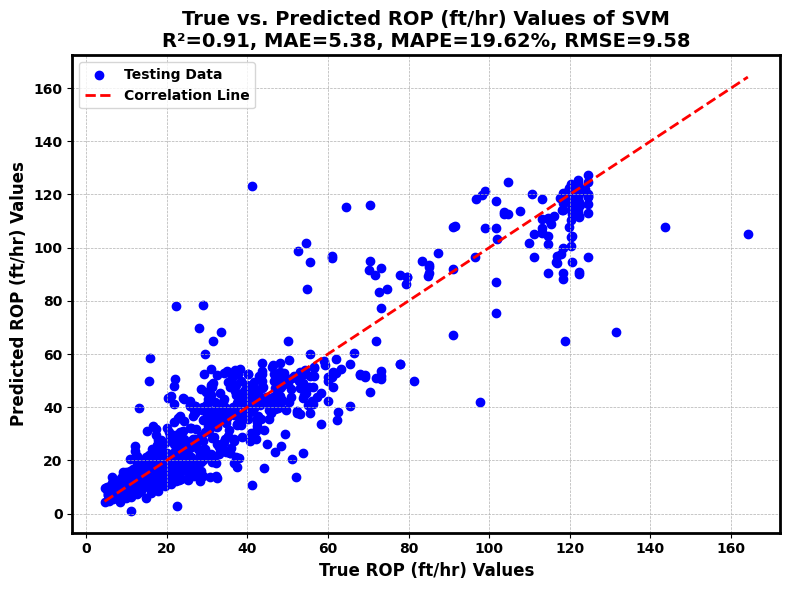

In [42]:
from sklearn.svm import SVR
from sklearn.exceptions import DataConversionWarning
import warnings
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv  # Explicitly enable halving search CV
from sklearn.model_selection import HalvingGridSearchCV, HalvingRandomSearchCV
# Suppress DataConversionWarning
warnings.filterwarnings("ignore", category=DataConversionWarning)
# Suppress FutureWarning related to DataFrame.mean(axis=None)
warnings.simplefilter(action='ignore', category=FutureWarning)
# Suppress UserWarning related to redundant color definition
warnings.simplefilter(action='ignore', category=UserWarning)

# Function to perform KNeighborsRegressor and visualization
def svm_regression_and_visualization(X_train_s, X_test_s, y_train, y_test, search_algorithm):
    # Create the SVR model
    svm_model = SVR()
    # Create a parameter grid for GridSearchCV for SVR
    param_grid = {
        'kernel': ['rbf'],
        'C': [100],
        'gamma': [ 0.1],
        'epsilon': [0.001],
    }

    # Initialize the selected search algorithm
    if search_algorithm == 'grid':
        search = GridSearchCV(knn_model, param_grid, cv=5, scoring='neg_mean_absolute_error', refit=True)
    elif search_algorithm == 'random':
        search = RandomizedSearchCV(knn_model, param_distributions=param_grid, n_iter=10, cv=5, scoring='neg_mean_absolute_error', refit=True)
    elif search_algorithm == 'halving_grid':
        search = HalvingGridSearchCV(knn_model, param_grid, cv=5, scoring='neg_mean_absolute_error', refit=True)
    elif search_algorithm == 'halving_random':
        search = HalvingRandomSearchCV(knn_model, param_distributions=param_grid, n_iter=10, cv=5, scoring='neg_mean_absolute_error', refit=True)
    else:
        raise ValueError("Invalid search algorithm. Please choose from 'grid', 'random', 'halving_grid', or 'halving_random'.")

    # Fit the search algorithm to your data
    search.fit(X_train_s, y_train)

    # Get the best hyperparameters and model
    best_hyperparameters = search.best_params_
    best_model = search.best_estimator_
    
    # Store the best hyperparameters in the dictionary
    best_tuned_hyper_param = best_hyperparameters

    # Print the best hyperparameters
    print("Best Hyperparameters:", best_tuned_hyper_param)

    # Make predictions on the test data
    y_pred_test = best_model.predict(X_test_s)
    y_pred_test = pd.DataFrame(y_pred_test)

    # Calculate R2 for training and testing data
    r2_test = r2_score(y_test, y_pred_test)

    # Calculate MAE, MAPE, and RMSE
    mae_test = mean_absolute_error(y_test, y_pred_test)
    mape_test = np.mean(np.abs((y_pred_test.values - y_test.values) / y_test.values)) * 100
    rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
    
    # Plot the true vs. predicted values with the metrics
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_test, c='blue', label='Testing Data')
    plt.xlabel(f'True {target_column_name} Values', fontsize=12, fontweight='bold')
    plt.ylabel(f'Predicted {target_column_name} Values', fontsize=12, fontweight='bold')
    plt.title(f'True vs. Predicted {target_column_name} Values of SVM\nR²={float(r2_test):.2f}, MAE={float(mae_test):.2f}, MAPE={float(mape_test):.2f}%, RMSE={float(rmse_test):.2f}',
          fontsize=14, fontweight='bold')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, c='red', label='Correlation Line')
    legend = plt.legend(loc='upper left', fontsize=10, frameon=True)
    plt.setp(legend.get_texts(), weight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=10, fontweight='bold')
    plt.yticks(fontsize=10, fontweight='bold')
    plt.gca().spines['top'].set_linewidth(2)
    plt.gca().spines['right'].set_linewidth(2)
    plt.gca().spines['bottom'].set_linewidth(2)
    plt.gca().spines['left'].set_linewidth(2)
    plt.tight_layout()
    
    #Saving the prediction of the tuned model
    y_pred_test_svm= pd.DataFrame(y_pred_test)
    y_pred_test_svm.columns=['ROP_pred_SVM']

    # Saving the prediction of the tuned model
    additional_columns = pd.DataFrame({'y_pred_test': y_pred_test, 'y_test': y_test})
    additional_columns.to_excel('prediction_data_SVM_additional_columns.xlsx', index=False)

    # Save the updated DataFrame to an Excel file
    with pd.ExcelWriter('prediction_data_SVM.xlsx', engine='openpyxl', mode='w') as writer:
        X_test_s.to_excel(writer, sheet_name='X_test_with_predictions', index=False)

    # Return metrics and plot
    return r2_test, mae_test, mape_test, rmse_test

# Function to return running time
def get_running_time(start_time):
    end_time = time.time()
    return end_time - start_time

# Main script
if __name__ == "__main__":
    # ... (your data loading and preprocessing)

    # Apply dimensionality reduction if needed
    # X_train_scaled_pca, X_test_scaled_pca, _, _ = apply_dimensionality_reduction(X_train_s, X_test_s)

    # Measure running time
    start_time = time.time()
    search_algorithm = input("Choose a search algorithm ('grid', 'random', 'halving_grid', or 'halving_random'): ")
    # Perform KNeighborsRegressor and visualization
    r2_test, mae_test, mape_test, rmse_test = svm_regression_and_visualization(X_train_s, X_test_s, y_train, y_test,search_algorithm)

    # Print running time
    print("Running Time (Seconds):", get_running_time(start_time))

    # Show the plot
    plt.show()

# (6) Perform Uncertainity Analysis of the Best Model's Predictions

In [43]:
svm_model = SVR()

mae_test_svm = []
mape_test_svm =[]
rmse_test_svm =[]
r2_test_svm =  []

# Split the data into features (X) and target (y)
X = data.iloc[:, :-1]  # All columns except the last one
y = data.iloc[:, -1:]   # The last column

# Define the list of possible train_sizes
possible_train_sizes = [0.7, 0.75, 0.8, 0.85, 0.9]
# Number of iterations
num_iterations = 2
for iteration in range(num_iterations):
    # Randomly select a train_size
    train_size = random.choice(possible_train_sizes)
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, test_size=1-train_size)

    if method_choice == 11:
        # IQR method
        Q1 = X_train.quantile(0.25)
        Q3 = X_train.quantile(0.75)
        IQR_values = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR_values
        upper_bound = Q3 + 1.5 * IQR_values
        outliers = ((X_train < lower_bound) | (X_train > upper_bound)).any(axis=1)
    
        # Create a DataFrame for IQR-based outliers
        X_train_i = pd.DataFrame(outliers.astype(int), index=X_train.index, columns=['outlier'])
        X_test_i = pd.DataFrame(np.zeros(X_test.shape[0]), index=X_test.index, columns=['outlier'])  # Assuming no outliers in the test set
        X_train_inliers = X_train[X_train_i['outlier'] != 1]  # Adjust indexing for inliers
        X_test_inliers = X_test[X_test_i['outlier'] != 1]  # Adjust indexing for inliers

        # Filter inliers
        y_train = y_train.loc[X_train_inliers.index]
        y_test = y_test.loc[X_test_inliers.index]
        outlier = None
    else:
         # Fit and predict using the chosen model
        outlier = model
        X_train_i = pd.DataFrame(model.fit_predict(X_train), index=X_train.index, columns=['outlier'])
        X_test_i = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=['outlier'])
        # Filter inliers
        X_train_inliers = X_train[X_train_i['outlier'] != -1]
        X_test_inliers = X_test[X_test_i['outlier'] != -1]
        # Predict target variable for inliers
        y_train = y_train.loc[X_train_inliers.index]
        y_test = y_test.loc[X_test_inliers.index]
    
    
    # scaling data
    scl= scaler
    scl.fit(X_train)
    # scaling using train and test data
    X_train_s = scl.transform(X_train_inliers)
    X_test_s = scl.transform(X_test_inliers)

    # Create a parameter grid for GridSearchCV for SVR
    param_grid = {
    'kernel': [ 'rbf'],
    'C': [100],
    'epsilon': [0.001],
    }
    
    # Define the list of possible train_sizes
    possible_cv = [3,4,5,6,7,8]
    cv = random.choice(possible_cv)
    
    # Initialize GridSearchCV
    grid_search = GridSearchCV(svm_model, param_grid, cv=cv, scoring='neg_mean_absolute_error', refit=True)
    # Fit the grid search to your data
    grid_search.fit(X_train_s, y_train);
    
    # Get the best hyperparameters and model
    best_hyperparameters = grid_search.best_params_
    best_model = grid_search.best_estimator_
    best_score = -grid_search.best_score_

    # Use the best model for predictions
    y_pred_test = best_model.predict(X_test_s)

    # Make predictions on the test data
    y_pred_test = best_model.predict(X_test_s)
    y_pred_test = pd.DataFrame(y_pred_test)

    # Calculate R2 for training and testing data
    r2_test = r2_score(y_test, y_pred_test)

    # Calculate MAE, MAPE, and RMSE
    mae_test = mean_absolute_error(y_test, y_pred_test)
    mape_test = np.mean(np.abs((y_pred_test.values - y_test.values) / y_test.values)) * 100
    rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
   
    # Append
    mae_test_svm.append(mae_test)
    mape_test_svm.append(mape_test)
    rmse_test_svm.append(rmse_test)
    r2_test_svm.append(r2_test)

print("Errors:")
print('mae_test_svm=',mae_test_svm)
print('mape_test_svm=',mape_test_svm)
print('rmse_test_svm=',rmse_test_svm)
print('r2_test_svm=',r2_test_svm)


Errors:
mae_test_svm= [5.605927061356011, 5.293957084565576]
mape_test_svm= [18.274512031537146, 19.138342958773844]
rmse_test_svm= [12.03700350086164, 10.541687379722152]
r2_test_svm= [0.8629061330931426, 0.8864185311581259]
